In [141]:
assert(False)

In [1]:
import os
import glob
from datetime import datetime
from datetime import timezone
import polars as pl
import matplotlib.pyplot as plt
from sklearn import linear_model
import numpy as np
import math
from sklearn.metrics import r2_score
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

start_date = datetime(2024, 1, 17, 0, 0, 0).replace(tzinfo=timezone.utc)
end_date = datetime(2024, 2, 4, 23, 59, 59).replace(tzinfo=timezone.utc)
system_ids = [3,6,10,11,12,13,16,18,20]

filter = '1h'

DATA_DIRECTORY = os.environ.get("DATA_DIRECTORY")
PICARRO_DATA_DIRECTORy = os.environ.get("PICARRO_DATA_DIRECTORY")


In [2]:
def rmse(y_true, y_meas):
    MSE = np.square(np.subtract(y_true, y_meas)).mean()
    RMSE = math.sqrt(MSE)

    return RMSE

def calc_r2(y_true, y_meas):
    return r2_score(y_true, y_meas)

In [3]:
df_cal = pl.scan_parquet(os.path.join(DATA_DIRECTORY, "processed", "slope_intercept_acropolis.parquet")) \
    .with_columns((pl.col("creation_timestamp").dt.timestamp("ms") / 3.6e6).alias("timestamp")) #3.6e6 ms are in 1h

# Perform RANSAC only on slope and then select valid calibrations

In [4]:
def fit_ransac(x, y, date):
    #x = range(len(y))

    Y = np.array(y)
    X = np.array(x)
    T = np.array(date)

    # Robustly fit linear model with RANSAC algorithm
    ransac = linear_model.RANSACRegressor(residual_threshold=0.01)
    ransac.fit(X.reshape(-1, 1), Y)
    inlier_mask = ransac.inlier_mask_
    outlier_mask = np.logical_not(inlier_mask)
    line_X = np.arange(X.min(), X.max())[:, np.newaxis]
    line_y_ransac = ransac.predict(line_X)
    
    # plot
    lw = 2
    
    plt.scatter(
        X[inlier_mask], Y[inlier_mask], color="yellowgreen", marker=".", label="Inliers"
    )
    plt.scatter(
        X[outlier_mask], Y[outlier_mask], color="gold", marker=".", label="Outliers"
    )
    plt.plot(
        line_X,
        line_y_ransac,
        color="cornflowerblue",
        linewidth=lw,
        label="RANSAC regressor",
    )
    plt.legend()
    plt.xlabel("Unix Time (h)")
    plt.ylabel(f"slope for system: {id}")
    plt.show()
    #----
    
    return inlier_mask

In [5]:
df_cal.filter(pl.col("system_name") == f"tum-esm-midcost-raspi-12").filter(pl.col("creation_timestamp").is_between(start_date, end_date)).collect()

creation_timestamp,date,system_name,slope,intercept,system_id,timestamp
"datetime[μs, UTC]",date,str,f64,f64,i64,f64
2024-01-29 03:31:15.780 UTC,2024-01-29,"""tum-esm-midcos…",1.02614,5.724103,12,474027.52105
2024-01-17 03:32:04.600 UTC,2024-01-17,"""tum-esm-midcos…",1.021356,8.316172,12,473739.534611
2024-01-21 03:30:46.600 UTC,2024-01-21,"""tum-esm-midcos…",1.036718,0.696257,12,473835.512944
2024-01-26 03:22:12.810 UTC,2024-01-26,"""tum-esm-midcos…",1.032371,3.181607,12,473955.370225
2024-02-04 03:29:16.360 UTC,2024-02-04,"""tum-esm-midcos…",1.020639,7.966754,12,474171.487878
2024-01-22 03:17:43.560 UTC,2024-01-22,"""tum-esm-midcos…",1.031887,2.691572,12,473859.295433
2024-01-30 03:02:01.360 UTC,2024-01-30,"""tum-esm-midcos…",1.031397,3.420903,12,474051.033711
2024-02-03 03:02:24.160 UTC,2024-02-03,"""tum-esm-midcos…",1.039269,0.056242,12,474147.040044
2024-01-31 03:31:56.110 UTC,2024-01-31,"""tum-esm-midcos…",1.032946,2.754713,12,474075.532253


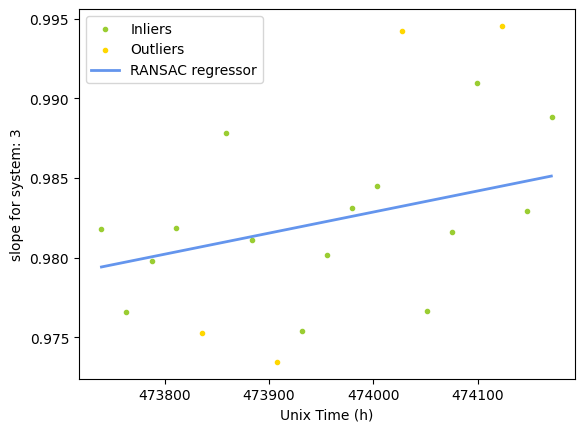

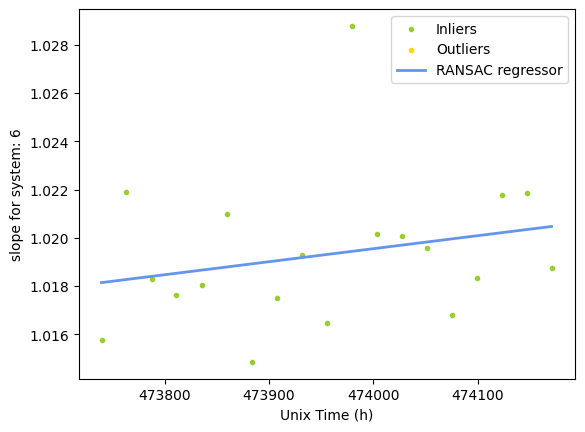

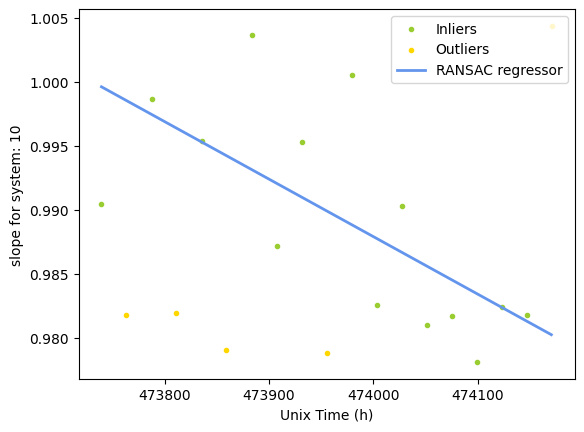

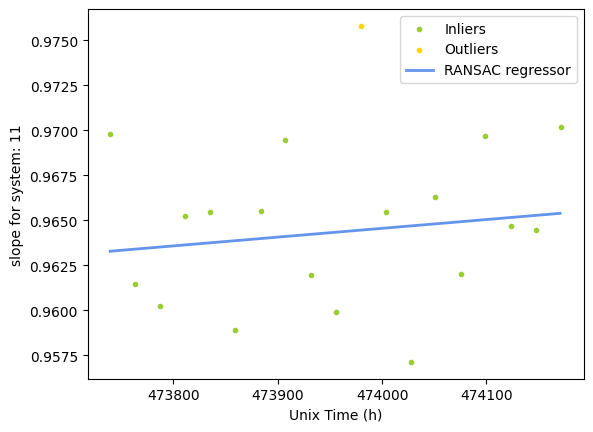

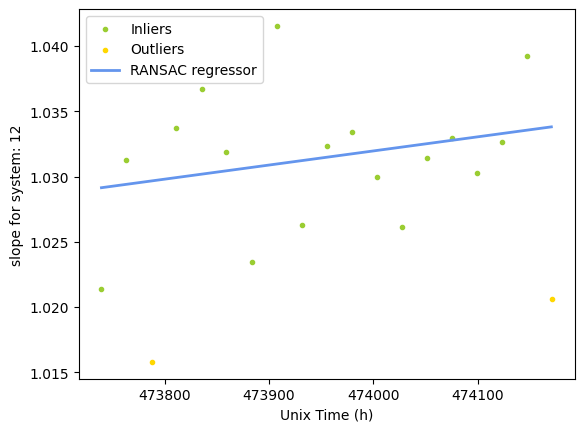

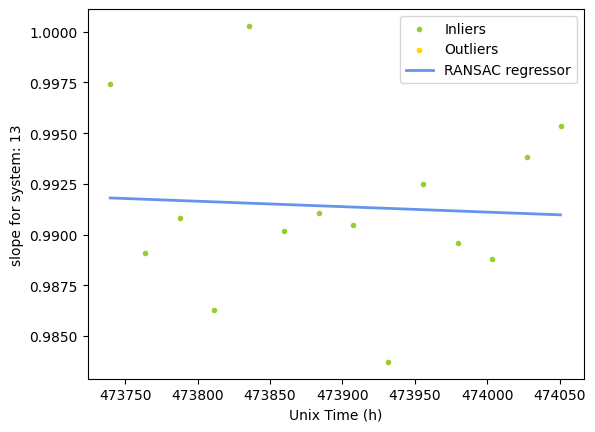

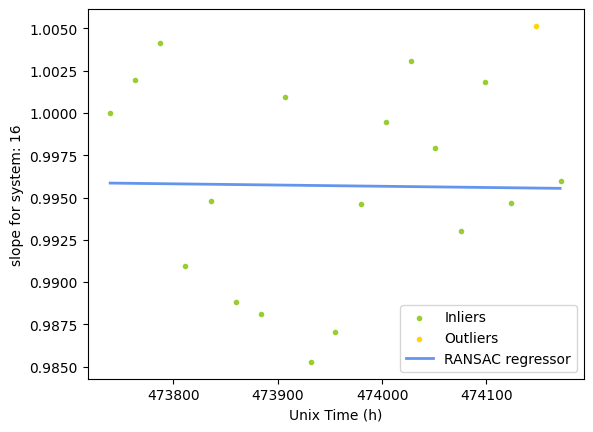

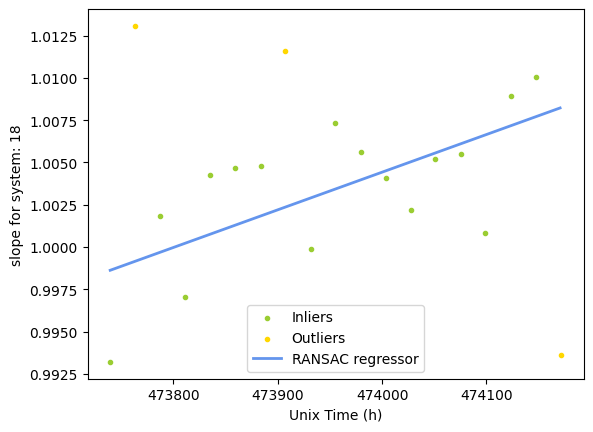

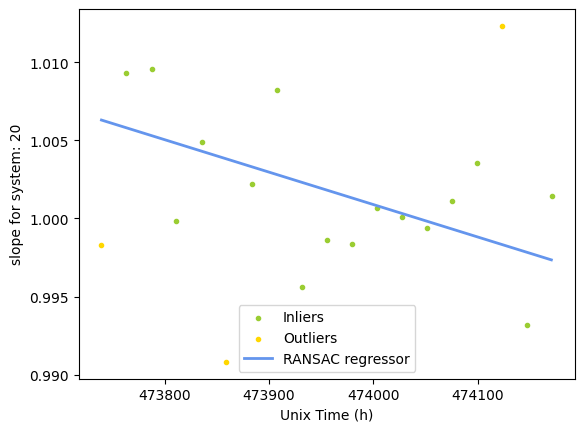

In [6]:
l_df_cor = []

for id in system_ids:
    try:
        df_sys = df_cal.filter(pl.col("system_name") == f"tum-esm-midcost-raspi-{id}").filter(pl.col("creation_timestamp").is_between(start_date, end_date))

        y = df_sys.select(pl.col("slope")).collect().to_series().to_list()
        x = df_sys.select(pl.col("timestamp")).collect().to_series().to_list()
        d = df_sys.select(pl.col("creation_timestamp")).collect().to_series().to_list()
        mask = fit_ransac(x,y,d)

        df_sys = df_sys.with_columns(mask = pl.Series(mask)).collect()
        
        l_df_cor.append(df_sys)
    except Exception as e:
        print(e)
        print(f"Could not find calibrations for system {id}")
    

df_cal_ransac = pl.concat(l_df_cor, how="diagonal")

In [7]:
df_cal_ransac = df_cal_ransac.with_columns((pl.col("slope") * pl.col("mask")).alias("ransac_slope")) \
    .with_columns((pl.col("intercept") * pl.col("mask")).alias("ransac_intercept")) \
    .filter(pl.col("mask") == True) \
    .sort("creation_timestamp") \
    .lazy()
    
df_cal_ransac.head(3).collect()

creation_timestamp,date,system_name,slope,intercept,system_id,timestamp,mask,ransac_slope,ransac_intercept
"datetime[μs, UTC]",date,str,f64,f64,i64,f64,bool,f64,f64
2024-01-17 03:30:15.070 UTC,2024-01-17,"""tum-esm-midcos…",0.98177,-22.870051,3,473739.504186,true,0.98177,-22.870051
2024-01-17 03:30:39.760 UTC,2024-01-17,"""tum-esm-midcos…",1.000003,-29.779135,16,473739.511044,true,1.000003,-29.779135
2024-01-17 03:31:13.610 UTC,2024-01-17,"""tum-esm-midcos…",0.993207,4.083245,18,473739.520447,true,0.993207,4.083245


In [8]:
df_dry = pl.scan_parquet(os.path.join(DATA_DIRECTORY, "processed", "acropolis_dry.parquet")).filter(pl.col("creation_timestamp").is_between(start_date, end_date))

In [9]:
df_dry.head(1).collect()

system_name,creation_timestamp,gmp343_raw,gmp343_compensated,gmp343_filtered,gmp343_temperature,wxt532_speed_avg,wxt532_speed_min,wxt532_speed_max,wxt532_direction_avg,wxt532_direction_min,wxt532_direction_max,wxt532_last_update_time,raspi_cpu_usage,raspi_cpu_temperature,raspi_disk_usage,enclosure_bme280_humidity,enclosure_bme280_pressure,enclosure_bme280_temperature,sht45_humidity,sht45_temperature,bme280_humidity,bme280_temperature,bme280_pressure,cal_bottle_id,cal_gmp343_raw,cal_gmp343_compensated,cal_gmp343_filtered,cal_gmp343_temperature,cal_bme280_temperature,cal_bme280_humidity,cal_bme280_pressure,cal_sht45_temperature,cal_sht45_humidity,revision,receipt_timestamp,raspi_memory_usage,wxt532_temperature,wxt532_heating_voltage,wxt532_supply_voltage,wxt532_reference_voltage,ups_battery_error_detected,ups_battery_above_voltage_threshold,ups_battery_is_fully_charged,ups_powered_by_grid,h2o_ah,h2o_v%,gmp343_dry
str,"datetime[μs, UTC]",f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,"datetime[ns, UTC]",f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
"""tum-esm-midcos…",2024-01-17 00:00:00 UTC,419.353333,487.056667,486.69,34.311667,null,null,null,null,null,null,null,null,null,null,null,null,null,10.146667,40.806,4.467333,40.648,942.372,null,null,null,null,null,null,null,null,null,null,33.0,2024-01-17 00:04:57.673172480 UTC,null,null,null,null,null,null,null,null,null,3.874436,0.583392,489.545971


In [10]:
l_df_dry_cut = []

for id in system_ids:
    
    df_temp = df_dry.filter(pl.col("system_name") == f"tum-esm-midcost-raspi-{id}")
    
    #cut maintainence / power outtage from 23.01.2024
    if id in [10,11,13]:
        before = df_temp.filter(pl.col("creation_timestamp") < datetime(2024, 1, 23, 14, 0, 0).replace(tzinfo=timezone.utc))
        after = df_temp.filter(pl.col("creation_timestamp") > datetime(2024, 1, 24, 3, 30, 0).replace(tzinfo=timezone.utc))

        df_temp = pl.concat([before, after], how="diagonal")
        
    l_df_dry_cut.append(df_temp)
    
df_dry = pl.concat(l_df_dry_cut, how="diagonal")

In [11]:
df_p_1h = pl.read_parquet(os.path.join(DATA_DIRECTORY,"processed", "1h_cal_corr_picarro.parquet")) \
        .filter(pl.col("creation_timestamp").is_between(start_date, end_date))

# reduce timestamp to date DD.XX.YYYY for measurement dataset and join slope and intercept from df_cal
df_date = df_dry.filter(pl.col("gmp343_dry") > 0) \
    .with_columns(pl.col("creation_timestamp").dt.date().alias("date")) \
    .join(df_cal_ransac, on = ["date","system_name"], how= "left")

        
l_df_cal_corr =[df_p_1h]

for id in system_ids:  
    # broadcast: via backward and forward fill
    # calibration correction: via coloumn operation 
    # aggregation: defined by filter
    # offset calculation to reference instrument PICARRO
    df_cal_corr = df_date.filter(pl.col("system_name") == f"tum-esm-midcost-raspi-{id}") \
    .fill_null(strategy = "backward") \
    .fill_null(strategy = "forward") \
    .with_columns(((pl.col("gmp343_dry")) * pl.col("slope") + pl.col("intercept")) \
    .alias("CO2_corr")) \
    .sort("creation_timestamp") \
    .groupby_dynamic("creation_timestamp", every='1h')  \
    .agg([
        pl.all().exclude(["creation_timestamp","system_name"]).mean(),
        pl.col("system_name")
        ]) \
    .with_columns(pl.col("system_name").list.last()) \
    .collect()
        
    df_cal_corr = df_cal_corr.join(df_p_1h.select("creation_timestamp", "CO2_corr") \
                .rename({"CO2_corr": "temp"}), on="creation_timestamp", how= "left") \
                .with_columns((pl.col("CO2_corr") - pl.col("temp")).alias("diff")) \
                .drop("temp")
        
        
    l_df_cal_corr.append(df_cal_corr)
        
    
df_cal_corr_agg_1h = pl.concat(l_df_cal_corr, how="diagonal")


/var/folders/y4/db3wnfk51k5977sk937k5q140000gn/T/ipykernel_6021/1897121046.py:23: DeprecationWarning: `groupby_dynamic` is deprecated. It has been renamed to `group_by_dynamic`.
  .groupby_dynamic("creation_timestamp", every='1h')  \
/var/folders/y4/db3wnfk51k5977sk937k5q140000gn/T/ipykernel_6021/1897121046.py:23: DeprecationWarning: `truncate` is deprecated and will be removed in a future version. Please replace `truncate=True` with `label='left'` to silence this warning.
  .groupby_dynamic("creation_timestamp", every='1h')  \


In [12]:
df_cal_corr_agg_1h.head(1)

creation_timestamp,CO2_corr,h2o_reported,slope,intercept,system_name,diff,gmp343_raw,gmp343_compensated,gmp343_filtered,gmp343_temperature,wxt532_speed_avg,wxt532_speed_min,wxt532_speed_max,wxt532_direction_avg,wxt532_direction_min,wxt532_direction_max,wxt532_last_update_time,raspi_cpu_usage,raspi_cpu_temperature,raspi_disk_usage,enclosure_bme280_humidity,enclosure_bme280_pressure,enclosure_bme280_temperature,sht45_humidity,sht45_temperature,bme280_humidity,bme280_temperature,bme280_pressure,cal_bottle_id,cal_gmp343_raw,cal_gmp343_compensated,cal_gmp343_filtered,cal_gmp343_temperature,cal_bme280_temperature,cal_bme280_humidity,cal_bme280_pressure,cal_sht45_temperature,cal_sht45_humidity,revision,receipt_timestamp,raspi_memory_usage,wxt532_temperature,wxt532_heating_voltage,wxt532_supply_voltage,wxt532_reference_voltage,ups_battery_error_detected,ups_battery_above_voltage_threshold,ups_battery_is_fully_charged,ups_powered_by_grid,h2o_ah,h2o_v%,gmp343_dry,date,creation_timestamp_right,system_id,timestamp,mask,ransac_slope,ransac_intercept
"datetime[μs, UTC]",f64,f64,f64,f64,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,"datetime[ns, UTC]",f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,date,"datetime[μs, UTC]",f64,f64,f64,f64,f64
2024-01-17 00:00:00 UTC,466.208946,0.49347,1.006043,0.093055,null,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


In [13]:
df_p_10m = pl.read_parquet(os.path.join(DATA_DIRECTORY,"processed", "10m_cal_corr_picarro.parquet")) \
        .filter(pl.col("creation_timestamp").is_between(start_date, end_date)) \
        .rename({"h2o_reported": "h2o_ppm"})

# reduce timestamp to date DD.XX.YYYY for measurement dataset and join slope and intercept from df_cal
df_date = df_dry.filter(pl.col("gmp343_dry") > 0) \
    .with_columns(pl.col("creation_timestamp").dt.date().alias("date")) \
    .join(df_cal_ransac, on = ["date","system_name"], how= "left")

        
l_df_cal_corr =[df_p_10m]

for id in system_ids:  
    # broadcast: via backward and forward fill
    # calibration correction: via coloumn operation 
    # aggregation: defined by filter
    # offset calculation to reference instrument PICARRO
    df_cal_corr = df_date.filter(pl.col("system_name") == f"tum-esm-midcost-raspi-{id}") \
    .fill_null(strategy = "forward") \
    .fill_null(strategy = "backward") \
    .with_columns(((pl.col("gmp343_dry")) * pl.col("slope") + pl.col("intercept")) \
    .alias("CO2_corr")) \
    .sort("creation_timestamp") \
    .groupby_dynamic("creation_timestamp", every='10m')  \
    .agg([
        pl.all().exclude(["creation_timestamp","system_name"]).mean(),
        pl.col("system_name")
        ]) \
    .with_columns(pl.col("system_name").list.last()) \
    .collect()
        
    df_cal_corr = df_cal_corr.join(df_p_10m.select("creation_timestamp", "CO2_corr") \
                .rename({"CO2_corr": "temp"}), on="creation_timestamp", how= "left") \
                .with_columns((pl.col("CO2_corr") - pl.col("temp")).alias("diff")) \
                .drop("temp")
        
    l_df_cal_corr.append(df_cal_corr)
        
    
df_cal_corr_agg_10m = pl.concat(l_df_cal_corr, how="diagonal")


/var/folders/y4/db3wnfk51k5977sk937k5q140000gn/T/ipykernel_6021/1702148172.py:24: DeprecationWarning: `groupby_dynamic` is deprecated. It has been renamed to `group_by_dynamic`.
  .groupby_dynamic("creation_timestamp", every='10m')  \
/var/folders/y4/db3wnfk51k5977sk937k5q140000gn/T/ipykernel_6021/1702148172.py:24: DeprecationWarning: `truncate` is deprecated and will be removed in a future version. Please replace `truncate=True` with `label='left'` to silence this warning.
  .groupby_dynamic("creation_timestamp", every='10m')  \


In [14]:
import plotly.express as px

#dataframe = df_cal_corr_agg_1h
dataframe = df_cal_corr_agg_10m

fig = px.line(dataframe, x="creation_timestamp", y=f"CO2_corr", markers=True, title = "CO2 Dry", color="system_name")
fig.show()

fig = px.line(dataframe, x="creation_timestamp", y=f"diff", markers=True, title = "Difference Acropolis System - PICARRO", color="system_name")
fig.show()

fig = px.line(dataframe, x="creation_timestamp", y=f"h2o_ppm", markers=True, title = "Absolute Humidity (Picarro in ppm)", color="system_name")
fig.show()

In [15]:
titles = []
for system_id in system_ids:
    titles.append(f"System: {system_id}")

fig = make_subplots(rows=3, cols=3, shared_yaxes='all', subplot_titles=(titles), x_title="ACROPOLIS (ppm)", y_title="Picarro (ppm)")
fig2 = make_subplots(rows=3, cols=3, shared_yaxes='all',  subplot_titles=(titles), x_title="ACROPOLIS (ppm)", y_title="Picarro (ppm)")
row = 1
col = 0

for system_id in system_ids:
    
    col += 1
    
    if col == 4:
        col = 1
        row += 1

    print(f"\nAnalysis for System {system_id}:")

    #----
    df_acropolis = dataframe.filter(pl.col("system_name")==f"tum-esm-midcost-raspi-{system_id}") \
        .select(["creation_timestamp", "CO2_corr", "h2o_ppm"]) \
        .rename({"CO2_corr": f"CO2_acropolis_{system_id}"}) \
        .rename({"h2o_ppm": f"H2O_acropolis_{system_id}"})
        
    df_picarro = dataframe.filter(pl.col("system_name")=="Picarro") \
        .select(["creation_timestamp", "CO2_corr","h2o_ppm"]) \
        .rename({"CO2_corr": f"CO2_picarro"}) \
        .rename({"h2o_ppm": f"H2O_picarro"})
        
    df_analysis = df_picarro.join(df_acropolis, on="creation_timestamp")  \
        .filter(pl.col("CO2_picarro") > 0)  \
        .filter(pl.col(f"CO2_acropolis_{system_id}") > 0)
        
    l_picarro = df_analysis.select("CO2_picarro").to_series().to_list()
    l_picarro_h2o = df_analysis.select("H2O_picarro").to_series().to_list()
    l_acropolis = df_analysis.select(f"CO2_acropolis_{system_id}").to_series().to_list()
    l_acropolis_h2o = df_analysis.select(f"H2O_acropolis_{system_id}").to_series().to_list()
    
    #----
    if len(l_acropolis) > 0:
        
        #plotly scatterplot
        fig.add_trace(go.Scatter(x=l_acropolis, y=l_picarro, name = f"MC-{system_id}", mode='markers'),row=row, col=col) 
        fig2.add_trace(go.Scatter(x=l_acropolis_h2o, y=l_picarro_h2o,  name = f"MC-{system_id}", mode='markers'),row=row, col=col)
        
        mean_offset = df_cal_corr_agg_1h.filter(pl.col("system_name")==f"tum-esm-midcost-raspi-{system_id}").select("diff").mean().item()
        #print(f"Offset {mean_offset}")
        
        rmse_result = rmse(l_picarro,l_acropolis)
        #print(f"RMSE: {rmse_result}")
        
        r2_result = calc_r2(l_picarro,l_acropolis)
        #print(f"R2: {r2_result}")
        
        print(f"Offset {mean_offset}, RMSE: {rmse_result}, R2: {r2_result}")
   
fig.update_layout(title_text="Scatter Plots: CO2 (dry)", height=1000, width=1000, showlegend=False)
#fig.update_layout(xaxis=dict(tickmode='linear',tick0=10,dtick=10), yaxis=dict(tickmode='linear',tick0=10,dtick=10))     
fig.show()
fig2.update_layout(title_text="Scatter Plots: Water Vaport (ppm)", height=1000, width=1000, showlegend=False)
#fig2.update_layout(xaxis=dict(tickmode='linear',tick0=0.25,dtick=0.25), yaxis=dict(tickmode='linear',tick0=0.25,dtick=0.25))    
fig2.show()


Analysis for System 3:
Offset -0.554574903102153, RMSE: 1.2952499138546945, R2: 0.9960073340743539

Analysis for System 6:
Offset 0.25577283308563564, RMSE: 4.665719250235484, R2: 0.9481810931357423

Analysis for System 10:
Offset -0.7809291180511824, RMSE: 1.67134404420192, R2: 0.9934230970234438

Analysis for System 11:
Offset 0.0824672046263274, RMSE: 1.4701453814765562, R2: 0.9949110628014833

Analysis for System 12:
Offset -0.8100028132156766, RMSE: 1.2832400230275667, R2: 0.9960798312570254

Analysis for System 13:
Offset 0.24634759088260227, RMSE: 1.0927113946783815, R2: 0.9974671502290834

Analysis for System 16:
Offset -0.1186698981206715, RMSE: 0.9397104002049226, R2: 0.9978983031177792

Analysis for System 18:
Offset -0.9272062773103847, RMSE: 1.3288065809914082, R2: 0.9957964858912817

Analysis for System 20:
Offset -0.4937741985887202, RMSE: 1.191844854957651, R2: 0.996618351832703


# Delta CO2 vs. Temperature, Pressure, Humidity

In [157]:
dataframe.head(3)

creation_timestamp,CO2_corr,h2o_ppm,slope,intercept,system_name,diff,gmp343_dry,h2o_ah,gmp343_temperature,bme280_pressure,date,creation_timestamp_right,timestamp,mask,ransac_slope,ransac_intercept
"datetime[μs, UTC]",f64,f64,f64,f64,str,f64,f64,f64,f64,f64,date,"datetime[μs, UTC]",f64,f64,f64,f64
2024-01-17 00:00:00 UTC,463.48549,0.488811,1.006043,0.093055,"""Picarro""",0.0,null,null,null,null,null,null,null,null,null,null
2024-01-17 00:10:00 UTC,465.594545,0.490532,1.006043,0.093055,"""Picarro""",0.0,null,null,null,null,null,null,null,null,null,null
2024-01-17 00:20:00 UTC,466.531979,0.490203,1.006043,0.093055,"""Picarro""",0.0,null,null,null,null,null,null,null,null,null,null


In [158]:
titles = []
for system_id in system_ids:
    titles.append(f"System: {system_id}")

fig = make_subplots(rows=3, cols=3, shared_yaxes='all', subplot_titles=(titles), x_title="Humidity (ppm)", y_title="ACROPOLIS - Picarro (ppm)")

row = 1
col = 0

for system_id in system_ids:
    
    col += 1
    
    if col == 4:
        col = 1
        row += 1

    #----
    df_plot = dataframe.filter(pl.col("system_name")==f"tum-esm-midcost-raspi-{system_id}") \
        .select(["creation_timestamp", "diff", "h2o_ppm"]) \
        
    l_delta = df_plot.select("diff").to_series().to_list()
    l_humidity = df_plot.select("h2o_ppm").to_series().to_list()
    
    fig.add_trace(go.Scatter(x=l_humidity, y=l_delta, name = f"MC-{system_id}", mode='markers'),row=row, col=col)

    
fig.update_layout(title_text="Scatter Plots: Delta CO2 vs Humidity", height=1000, width=1000, showlegend=False)
#fig.update_layout(xaxis=dict(tickmode='linear',tick0=10,dtick=10), yaxis=dict(tickmode='linear',tick0=10,dtick=10))     
fig.show()


In [159]:
titles = []
for system_id in system_ids:
    titles.append(f"System: {system_id}")

fig = make_subplots(rows=3, cols=3, shared_yaxes='all', subplot_titles=(titles), x_title="GMP343 Temperature (°C)", y_title="ACROPOLIS - Picarro (ppm)")

row = 1
col = 0

for system_id in system_ids:
    
    col += 1
    
    if col == 4:
        col = 1
        row += 1

    #----
    df_plot = dataframe.filter(pl.col("system_name")==f"tum-esm-midcost-raspi-{system_id}") \
        .select(["creation_timestamp", "diff", "gmp343_temperature"]) \
        
    l_delta = df_plot.select("diff").to_series().to_list()
    l_humidity = df_plot.select("gmp343_temperature").to_series().to_list()
    
    fig.add_trace(go.Scatter(x=l_humidity, y=l_delta, name = f"MC-{system_id}", mode='markers'),row=row, col=col)

    
fig.update_layout(title_text="Scatter Plots: Delta CO2 vs Temperature", height=1000, width=1000, showlegend=False,
                  xaxis1 = dict(range=[23, 32]),
                  xaxis2 = dict(range=[23, 32]),
                  xaxis3 = dict(range=[23, 32]),
                  xaxis4 = dict(range=[23, 32]),
                  xaxis5 = dict(range=[23, 32]),
                  xaxis6 = dict(range=[23, 32]),
                  xaxis7 = dict(range=[23, 32]),
                  xaxis8 = dict(range=[23, 32]),
                  xaxis9 = dict(range=[23, 32]),)
#fig.update_layout(xaxis=dict(tickmode='linear',tick0=10,dtick=10), yaxis=dict(tickmode='linear',tick0=10,dtick=10))     
fig.show()


In [160]:
titles = []
for system_id in system_ids:
    titles.append(f"System: {system_id}")

fig = make_subplots(rows=3, cols=3, shared_yaxes='all', subplot_titles=(titles), x_title="BME280 Inlet Pressure (hPa)", y_title="ACROPOLIS - Picarro (ppm)")

row = 1
col = 0

for system_id in system_ids:
    
    col += 1
    
    if col == 4:
        col = 1
        row += 1

    #----
    df_plot = dataframe.filter(pl.col("system_name")==f"tum-esm-midcost-raspi-{system_id}") \
        .select(["creation_timestamp", "diff", "bme280_pressure"]) \
        
    l_delta = df_plot.select("diff").to_series().to_list()
    l_humidity = df_plot.select("bme280_pressure").to_series().to_list()
    
    fig.add_trace(go.Scatter(x=l_humidity, y=l_delta, name = f"MC-{system_id}", mode='markers'),row=row, col=col)

    
fig.update_layout(title_text="Scatter Plots: Delta CO2 vs Inlet Pressure", height=1000, width=1000, showlegend=False)
#fig.update_layout(xaxis=dict(tickmode='linear',tick0=10,dtick=10), yaxis=dict(tickmode='linear',tick0=10,dtick=10))     
fig.show()


# Substract mean offset

In [161]:
for system_id in system_ids:

    print(f"\nAnalysis for System {system_id}:")

    #----
    mean_offset = 0
    if len(l_acropolis) > 0:
        mean_offset = df_cal_corr_agg_1h.filter(pl.col("system_name")==f"tum-esm-midcost-raspi-{system_id}").select("diff").mean().item()
    
    df_acropolis = df_cal_corr_agg_1h.filter(pl.col("system_name")==f"tum-esm-midcost-raspi-{system_id}") \
        .select(["creation_timestamp", "CO2_corr"]) \
        .with_columns(pl.col("CO2_corr") - mean_offset)  \
        .rename({"CO2_corr": f"CO2_acropolis_{system_id}"})
        
    df_picarro = df_cal_corr_agg_1h.filter(pl.col("system_name")=="Picarro") \
        .select(["creation_timestamp", "CO2_corr"]) \
        .rename({"CO2_corr": f"CO2_picarro"})
        
    df_analysis = df_picarro.join(df_acropolis, on="creation_timestamp")  \
        .filter(pl.col("CO2_picarro") > 0)  \
        .filter(pl.col(f"CO2_acropolis_{system_id}") > 0)
        
    l_picarro = df_analysis.select("CO2_picarro").to_series().to_list()
    l_acropolis = df_analysis.select(f"CO2_acropolis_{system_id}").to_series().to_list()
    
    #----
    if len(l_acropolis) > 0:
        
        rmse_result = rmse(l_picarro,l_acropolis)
        #print(f"RMSE: {rmse_result}")
        
        r2_result = calc_r2(l_picarro,l_acropolis)
        #print(f"R2: {r2_result}")
        
        print(f"RMSE: {rmse_result}, R2: {r2_result}")


Analysis for System 3:
RMSE: 0.9060955050469998, R2: 0.997969225208625

Analysis for System 6:
RMSE: 3.9440408176794985, R2: 0.9615234066324362

Analysis for System 10:
RMSE: 1.4075898933154325, R2: 0.9951496124241603

Analysis for System 11:
RMSE: 1.6343505217041951, R2: 0.9934609512515318

Analysis for System 12:
RMSE: 0.6663422618183376, R2: 0.9989017314960483

Analysis for System 13:
RMSE: 0.834569694786507, R2: 0.9984614222201299

Analysis for System 16:
RMSE: 0.8944859595138223, R2: 0.9980209313115259

Analysis for System 18:
RMSE: 0.9957209100229683, R2: 0.9975476126542029

Analysis for System 20:
RMSE: 0.859931124461048, R2: 0.9981708844237203
